<center> <h1> 120 Years of the Olympic Games </h1> </center>

### Data Preparation

In [1]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
sb.set()

In [2]:
data = pd.read_csv('athlete_events.csv')
# Data Cleaning: Fill "No Medal" to NA values
data['Medal'].fillna(value = "No Medal", inplace = True)
data.head(20)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,No Medal
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,No Medal
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,No Medal
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,No Medal
5,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,"Speed Skating Women's 1,000 metres",No Medal
6,5,Christine Jacoba Aaftink,F,25.0,185.0,82.0,Netherlands,NED,1992 Winter,1992,Winter,Albertville,Speed Skating,Speed Skating Women's 500 metres,No Medal
7,5,Christine Jacoba Aaftink,F,25.0,185.0,82.0,Netherlands,NED,1992 Winter,1992,Winter,Albertville,Speed Skating,"Speed Skating Women's 1,000 metres",No Medal
8,5,Christine Jacoba Aaftink,F,27.0,185.0,82.0,Netherlands,NED,1994 Winter,1994,Winter,Lillehammer,Speed Skating,Speed Skating Women's 500 metres,No Medal
9,5,Christine Jacoba Aaftink,F,27.0,185.0,82.0,Netherlands,NED,1994 Winter,1994,Winter,Lillehammer,Speed Skating,"Speed Skating Women's 1,000 metres",No Medal


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 15 columns):
ID        271116 non-null int64
Name      271116 non-null object
Sex       271116 non-null object
Age       261642 non-null float64
Height    210945 non-null float64
Weight    208241 non-null float64
Team      271116 non-null object
NOC       271116 non-null object
Games     271116 non-null object
Year      271116 non-null int64
Season    271116 non-null object
City      271116 non-null object
Sport     271116 non-null object
Event     271116 non-null object
Medal     271116 non-null object
dtypes: float64(3), int64(2), object(10)
memory usage: 31.0+ MB


### Use an addition dataset (host_cities.csv) to add a column for Host Country

In [4]:
cities = pd.read_csv('host_cities.csv')
cities.index = cities['City']
cities = cities[['Country']]
city_dic = cities.to_dict()['Country']
city_dic

{'Athens': 'Greece',
 'Paris': 'France',
 'St. Louis': 'United States',
 'Athina': 'Greece',
 'London': 'United Kingdom',
 'Stockholm': 'Sweden',
 'Berlin': 'Nazi Germany',
 'Antwerp': 'Belgium',
 'Chamonix': 'France',
 'St. Moritz': 'Switzerland',
 'Amsterdam': 'Netherlands',
 'Lake Placid': 'United States',
 'Los Angeles': 'United States',
 'Garmisch-Partenkirchen': 'Nazi Germany',
 'Sapporo\n Garmisch-Partenkirchen': 'Empire of Japan\n  Nazi Germany',
 'Tokyo\n Helsinki': 'Empire of Japan\n  Finland',
 "Cortina d'Ampezzo": 'Italy',
 'Oslo': 'Norway',
 'Helsinki': 'Finland',
 'Melbourne\n Stockholm': 'Australia\n  Sweden',
 'Squaw Valley': 'United States',
 'Rome': 'Italy',
 'Innsbruck': 'Austria',
 'Tokyo': 'Japan',
 'Grenoble': 'France',
 'Mexico City': 'Mexico',
 'Sapporo': 'Japan',
 'Munich': 'West Germany',
 'Montreal': 'Canada',
 'Moscow': 'Soviet Union',
 'Sarajevo': 'Yugoslavia',
 'Calgary': 'Canada',
 'Seoul': 'South Korea',
 'Albertville': 'France',
 'Barcelona': 'Spain',
 

### Use an  dataset (noc_regions.csv) to add a column for Team Country


In [5]:
team_countires = pd.read_csv('noc_regions.csv')
team_countires.index = team_countires['NOC']
team_countires = team_countires[['region']]
team_countires_dic = team_countires.to_dict()['region']
team_countires_dic

{'AFG': 'Afghanistan',
 'AHO': 'Curacao',
 'ALB': 'Albania',
 'ALG': 'Algeria',
 'AND': 'Andorra',
 'ANG': 'Angola',
 'ANT': 'Antigua',
 'ANZ': 'Australia',
 'ARG': 'Argentina',
 'ARM': 'Armenia',
 'ARU': 'Aruba',
 'ASA': 'American Samoa',
 'AUS': 'Australia',
 'AUT': 'Austria',
 'AZE': 'Azerbaijan',
 'BAH': 'Bahamas',
 'BAN': 'Bangladesh',
 'BAR': 'Barbados',
 'BDI': 'Burundi',
 'BEL': 'Belgium',
 'BEN': 'Benin',
 'BER': 'Bermuda',
 'BHU': 'Bhutan',
 'BIH': 'Bosnia and Herzegovina',
 'BIZ': 'Belize',
 'BLR': 'Belarus',
 'BOH': 'Czech Republic',
 'BOL': 'Boliva',
 'BOT': 'Botswana',
 'BRA': 'Brazil',
 'BRN': 'Bahrain',
 'BRU': 'Brunei',
 'BUL': 'Bulgaria',
 'BUR': 'Burkina Faso',
 'CAF': 'Central African Republic',
 'CAM': 'Cambodia',
 'CAN': 'Canada',
 'CAY': 'Cayman Islands',
 'CGO': 'Republic of Congo',
 'CHA': 'Chad',
 'CHI': 'Chile',
 'CHN': 'China',
 'CIV': 'Ivory Coast',
 'CMR': 'Cameroon',
 'COD': 'Democratic Republic of the Congo',
 'COK': 'Cook Islands',
 'COL': 'Colombia',
 

### Compare Host Country and Team Country to determine Home Advantage

In [6]:
for i in data.index:
    data.at[i, 'Host Country'] = city_dic[data.at[i, 'City']]
    data.at[i, 'Team Country'] = team_countires_dic[data.at[i, 'NOC']]
    if (data.at[i, 'Host Country'] == data.at[i, 'Team Country']):
        data.at[i, 'Home Advantage'] = True
    else:
        data.at[i, 'Home Advantage'] = False
# In 1936, change Host Country from 'Nazi Germany' to 'Germany' so as to match team country
data['Host Country'].replace(to_replace = 'Nazi Germany', value = 'Germany', inplace = True)
data.sample(n = 10)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Host Country,Team Country,Home Advantage
133817,67383,"John Sylvester ""Jack"" Laybourne",M,29.0,NaN,NaN,Great Britain,GBR,1956 Summer,1956,Summer,Melbourne,Football,Football Men's Football,No Medal,Australia,United Kingdom,False
262919,131560,Brant Ian Woodward,M,34.0,180.0,90.0,New Zealand,NZL,1996 Summer,1996,Summer,Atlanta,Shooting,Shooting Men's Trap,No Medal,United States,New Zealand,False
118735,60080,Kim Jong-Hyeon,M,27.0,170.0,73.0,South Korea,KOR,2012 Summer,2012,Summer,London,Shooting,"Shooting Men's Air Rifle, 10 metres",No Medal,United Kingdom,South Korea,False
182345,91662,James Parker,M,28.0,182.0,111.0,United States,USA,2004 Summer,2004,Summer,Athina,Athletics,Athletics Men's Hammer Throw,No Medal,Greece,United States,False
428,236,Ragab Abdelhay Saad Abdelrazek Abdallah,M,25.0,170.0,94.0,Egypt,EGY,2016 Summer,2016,Summer,Rio de Janeiro,Weightlifting,Weightlifting Men's Middle-Heavyweight,No Medal,Brazil,Egypt,False
241719,121069,"Donald Robert ""Don"" Tonry",M,24.0,170.0,63.0,United States,USA,1960 Summer,1960,Summer,Roma,Gymnastics,Gymnastics Men's Pommelled Horse,No Medal,Italy,United States,False
115107,58312,Scott Keach,M,51.0,185.0,80.0,Australia,AUS,2016 Summer,2016,Summer,Rio de Janeiro,Equestrianism,"Equestrianism Mixed Jumping, Team",No Medal,Brazil,Australia,False
198540,99686,Brigitte Reid (Bittner-),F,28.0,177.0,61.0,Canada,CAN,1984 Summer,1984,Summer,Los Angeles,Athletics,Athletics Women's High Jump,No Medal,United States,Canada,False
80389,40799,Andreas Gloerfeld,M,24.0,180.0,70.0,West Germany,FRG,1972 Summer,1972,Summer,Munich,Athletics,Athletics Men's Long Jump,No Medal,West Germany,Germany,False
223073,112035,Zhansay Smagulov,M,23.0,169.0,66.0,Kazakhstan,KAZ,2016 Summer,2016,Summer,Rio de Janeiro,Judo,Judo Men's Half-Lightweight,No Medal,Brazil,Kazakhstan,False


### Data Exploration

In [7]:
all_olympic_games = data['Games'].unique()
all_olympic_games.sort()
all_olympic_games

array(['1896 Summer', '1900 Summer', '1904 Summer', '1906 Summer',
       '1908 Summer', '1912 Summer', '1920 Summer', '1924 Summer',
       '1924 Winter', '1928 Summer', '1928 Winter', '1932 Summer',
       '1932 Winter', '1936 Summer', '1936 Winter', '1948 Summer',
       '1948 Winter', '1952 Summer', '1952 Winter', '1956 Summer',
       '1956 Winter', '1960 Summer', '1960 Winter', '1964 Summer',
       '1964 Winter', '1968 Summer', '1968 Winter', '1972 Summer',
       '1972 Winter', '1976 Summer', '1976 Winter', '1980 Summer',
       '1980 Winter', '1984 Summer', '1984 Winter', '1988 Summer',
       '1988 Winter', '1992 Summer', '1992 Winter', '1994 Winter',
       '1996 Summer', '1998 Winter', '2000 Summer', '2002 Winter',
       '2004 Summer', '2006 Winter', '2008 Summer', '2010 Winter',
       '2012 Summer', '2014 Winter', '2016 Summer'], dtype=object)

In [8]:
countries = data['Team Country'].unique()
countries

array(['China', 'Denmark', 'Netherlands', 'United States', 'Finland',
       'Norway', 'Romania', 'Estonia', 'France', 'Morocco', 'Spain',
       'Egypt', 'Iran', 'Bulgaria', 'Italy', 'Chad', 'Azerbaijan',
       'Sudan', 'Russia', 'Argentina', 'Cuba', 'Belarus', 'Greece',
       'Cameroon', 'Turkey', 'Chile', 'Mexico', 'Nicaragua', 'Hungary',
       'Nigeria', 'Algeria', 'Kuwait', 'Bahrain', 'Pakistan', 'Iraq',
       'Syria', 'Lebanon', 'Qatar', 'Malaysia', 'Germany', 'Canada',
       'Ireland', 'Australia', 'South Africa', 'Eritrea', 'Tanzania',
       'Jordan', 'Tunisia', 'Libya', 'Belgium', 'Djibouti', 'Palestine',
       'Comoros', 'Kazakhstan', 'Brunei', 'India', 'Saudi Arabia',
       'Maldives', 'Ethiopia', 'United Arab Emirates', 'Yemen',
       'Indonesia', 'Philippines', 'Singapore', 'Uzbekistan',
       'Kyrgyzstan', 'Tajikistan', 'Japan', 'Republic of Congo',
       'Switzerland', 'Brazil', 'Monaco', 'Israel', 'Uruguay', 'Sweden',
       'Virgin Islands, US', 'Sri Lanka',

In [9]:
num_people_from_country_at_games = pd.DataFrame()

for i in range(len(all_olympic_games)):
    num_people_from_country_at_games.at[i, 'Games'] = all_olympic_games[i]
    all_people_at_games = data[data['Games'] == all_olympic_games[i]]
    for country in data['Team Country'].unique():
        country_people_at_games = all_people_at_games[all_people_at_games['Team Country'] == country]
        num_people_from_country_at_games.at[i, country] = country_people_at_games['ID'].size
    
num_people_from_country_at_games

,Games,China,Denmark,Netherlands,United States,Finland,Norway,Romania,Estonia,France,...,Nauru,Vietnam,Bhutan,Marshall Islands,Kiribati,Unknown,Tuvalu,Kosovo,South Sudan,Lesotho
0,1896 Summer,0.0,15.0,0.0,27.0,0.0,0.0,0.0,0.0,26.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1900 Summer,0.0,36.0,73.0,135.0,0.0,29.0,1.0,0.0,1071.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1904 Summer,0.0,0.0,0.0,1109.0,0.0,6.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1906 Summer,0.0,68.0,49.0,81.0,18.0,55.0,0.0,0.0,174.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1908 Summer,0.0,107.0,218.0,219.0,94.0,103.0,0.0,0.0,319.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,1912 Summer,0.0,233.0,45.0,364.0,233.0,263.0,0.0,0.0,232.0,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0
6,1920 Summer,0.0,246.0,213.0,473.0,136.0,267.0,0.0,20.0,452.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,1924 Summer,0.0,158.0,246.0,459.0,253.0,105.0,45.0,47.0,636.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,1924 Winter,0.0,0.0,0.0,41.0,33.0,36.0,0.0,0.0,68.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,1928 Summer,0.0,122.0,384.0,426.0,132.0,79.0,33.0,23.0,422.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
num_medals_from_country_at_games = pd.DataFrame()

for i in range(len(all_olympic_games)):
    num_medals_from_country_at_games.at[i, 'Games'] = all_olympic_games[i]
    all_people_at_games = data[data['Games'] == all_olympic_games[i]]
    for country in data['Team Country'].unique():
        country_people_at_games = all_people_at_games[all_people_at_games['Team Country'] == country]
        country_medals_at_games = country_people_at_games[country_people_at_games['Medal'] != 'No Medal']
        num_medals_from_country_at_games.at[i, country] = country_medals_at_games['ID'].size
    
num_medals_from_country_at_games

,Games,China,Denmark,Netherlands,United States,Finland,Norway,Romania,Estonia,France,...,Nauru,Vietnam,Bhutan,Marshall Islands,Kiribati,Unknown,Tuvalu,Kosovo,South Sudan,Lesotho
0,1896 Summer,0.0,6.0,0.0,20.0,0.0,0.0,0.0,0.0,11.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1900 Summer,0.0,9.0,27.0,63.0,0.0,9.0,0.0,0.0,235.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1904 Summer,0.0,0.0,0.0,394.0,0.0,2.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1906 Summer,0.0,34.0,6.0,24.0,4.0,25.0,0.0,0.0,64.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1908 Summer,0.0,17.0,16.0,65.0,30.0,42.0,0.0,0.0,40.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,1912 Summer,0.0,87.0,26.0,107.0,71.0,80.0,0.0,0.0,26.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,1920 Summer,0.0,71.0,50.0,194.0,52.0,137.0,0.0,3.0,141.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,1924 Summer,0.0,14.0,27.0,182.0,52.0,22.0,16.0,6.0,110.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,1924 Winter,0.0,0.0,0.0,12.0,15.0,17.0,0.0,0.0,10.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,1928 Summer,0.0,15.0,57.0,88.0,25.0,9.0,0.0,9.0,50.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [11]:
country_at_games = pd.DataFrame()

#for i in range(len(all_olympic_games)):
for i in range(1):
    country_at_games.at[i, 'Games'] = all_olympic_games[i]
    all_people_at_games = data[data['Games'] == all_olympic_games[i]]
    for country in data['Team Country'].unique():
        country_people_at_games = all_people_at_games[all_people_at_games['Team Country'] == country]
        
        if country_people_at_games['ID'].size > 0: 
            print(country)
            print(country_people_at_games['Medal'].value_counts())
    
country_at_games

Denmark
No Medal    9
Bronze      3
Silver      2
Gold        1
Name: Medal, dtype: int64
United States
Gold        11
No Medal     7
Silver       7
Bronze       2
Name: Medal, dtype: int64
France
No Medal    15
Gold         5
Silver       4
Bronze       2
Name: Medal, dtype: int64
Italy
No Medal    1
Name: Medal, dtype: int64
Greece
No Medal    100
Bronze       20
Silver       18
Gold         10
Name: Medal, dtype: int64
Hungary
No Medal    12
Bronze       3
Gold         2
Silver       1
Name: Medal, dtype: int64
Germany
No Medal    62
Gold        25
Silver       5
Bronze       2
Name: Medal, dtype: int64
Australia
Gold        2
No Medal    2
Bronze      1
Name: Medal, dtype: int64
Switzerland
No Medal    5
Silver      2
Gold        1
Name: Medal, dtype: int64
Sweden
No Medal    5
Name: Medal, dtype: int64
United Kingdom
No Medal    16
Silver       3
Bronze       3
Gold         3
Name: Medal, dtype: int64
Austria
No Medal    3
Gold        2
Bronze      2
Silver      1
Name: Medal, dty

,Games
0,1896 Summer


In [12]:
unique_countires = data['Team Country'].unique()
for i in range(1):
    game = pd.DataFrame()
    game_season = all_olympic_games[i]
    print(game_season)
    all_people_at_games = data[data['Games'] == all_olympic_games[i]]
    for country_index in range(len(unique_countires)):
        game.at[country_index, 'Country'] = unique_countires[country_index]
        country_people_at_games = all_people_at_games[all_people_at_games['Team Country'] == unique_countires[country_index]]
        game.at[country_index, 'Participants'] = country_people_at_games['Medal'].size
        game.at[country_index, 'Medals'] = country_people_at_games[country_people_at_games['Medal'] != 'No Medal']['ID'].size
        game.at[country_index, 'Gold'] = country_people_at_games[country_people_at_games['Medal'] == 'Gold']['ID'].size
        game.at[country_index, 'Silver'] = country_people_at_games[country_people_at_games['Medal'] == 'Silver']['ID'].size
        game.at[country_index, 'Bronze'] = country_people_at_games[country_people_at_games['Medal'] == 'Bronze']['ID'].size
        #game.at[country_index, 'Total Participants'] = country_people_at_games['Medal'].size
        #game.at[country_index, 'Total Participants'] = country_people_at_games['Medal'].size
        #if country_people_at_games['Medal'].size > 0 :game.at[country_index, 'Medal'] = country_people_at_games['Medal'].size
        #game.at[i, country] = country_people_at_games['Medal'].value_counts()

#sb.catplot(y = "Medal", data = country_people_at_games, kind = "count", height = 8)
        #print(country_people_at_games)
game

1896 Summer


,Country,Participants,Medals,Gold,Silver,Bronze
0,China,0.0,0.0,0.0,0.0,0.0
1,Denmark,15.0,6.0,1.0,2.0,3.0
2,Netherlands,0.0,0.0,0.0,0.0,0.0
3,United States,27.0,20.0,11.0,7.0,2.0
4,Finland,0.0,0.0,0.0,0.0,0.0
5,Norway,0.0,0.0,0.0,0.0,0.0
6,Romania,0.0,0.0,0.0,0.0,0.0
7,Estonia,0.0,0.0,0.0,0.0,0.0
8,France,26.0,11.0,5.0,4.0,2.0
9,Morocco,0.0,0.0,0.0,0.0,0.0


In [13]:
games = pd.DataFrame()

for i in range(len(all_olympic_games)):
    games.at[i, 'Games'] = all_olympic_games[i]
    all_people_at_games = data[data['Games'] == all_olympic_games[i]]
    games.at[i, 'Host Country'] = all_people_at_games.iloc[1, 15]
    #for country in data['Team Country'].unique():
     #   country_people_at_games = all_people_at_games[all_people_at_games['Team Country'] == country]
    #    games.at[i, country] = country_people_at_games['ID'].size
    home_people = all_people_at_games[all_people_at_games['Home Advantage'] == True]
    non_home_people = all_people_at_games[all_people_at_games['Home Advantage'] == False]
    games.at[i, 'Home Participants'] = home_people['ID'].size
    games.at[i, 'Non-Home Participants'] = non_home_people['ID'].size
    home_people_medals = home_people[home_people['Medal'] != 'No Medal']
    non_home_people_medals = non_home_people[non_home_people['Medal'] != 'No Medal']
    games.at[i, 'Home Participants Medals'] = home_people_medals['ID'].size
    games.at[i, 'Non Home Participants Medals'] = non_home_people_medals['ID'].size
    games.at[i, 'Home Win Rate'] = games.at[i, 'Home Participants Medals']/games.at[i, 'Home Participants']
    games.at[i, 'Non Home Win Rate'] = games.at[i, 'Non Home Participants Medals']/games.at[i, 'Non-Home Participants']
    games.at[i, 'home>non home'] = games.at[i, 'Home Win Rate'] > games.at[i, 'Non Home Win Rate']
    games.at[i, '% of home medals'] = games.at[i, 'Home Participants Medals']/(games.at[i, 'Home Participants Medals'] + games.at[i, 'Non Home Participants Medals'])
games

C:\Users\DELL\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in double_scalars


,Games,Host Country,Home Participants,Non-Home Participants,Home Participants Medals,Non Home Participants Medals,Home Win Rate,Non Home Win Rate,home>non home,% of home medals
0,1896 Summer,Greece,148.0,232.0,48.0,95.0,0.324324,0.409483,False,0.335664
1,1900 Summer,France,1071.0,865.0,235.0,369.0,0.219421,0.426590,False,0.389073
2,1904 Summer,United States,1109.0,192.0,394.0,92.0,0.355275,0.479167,False,0.810700
3,1906 Summer,Greece,495.0,1238.0,102.0,356.0,0.206061,0.287561,False,0.222707
4,1908 Summer,United Kingdom,972.0,2129.0,368.0,463.0,0.378601,0.217473,True,0.442840
5,1912 Summer,Sweden,714.0,3326.0,190.0,751.0,0.266106,0.225797,True,0.201913
6,1920 Summer,Belgium,518.0,3774.0,188.0,1120.0,0.362934,0.296767,True,0.143731
7,1924 Summer,France,636.0,4597.0,110.0,722.0,0.172956,0.157059,True,0.132212
8,1924 Winter,France,68.0,392.0,10.0,120.0,0.147059,0.306122,False,0.076923
9,1928 Summer,Netherlands,384.0,4608.0,57.0,677.0,0.148438,0.146918,True,0.077657


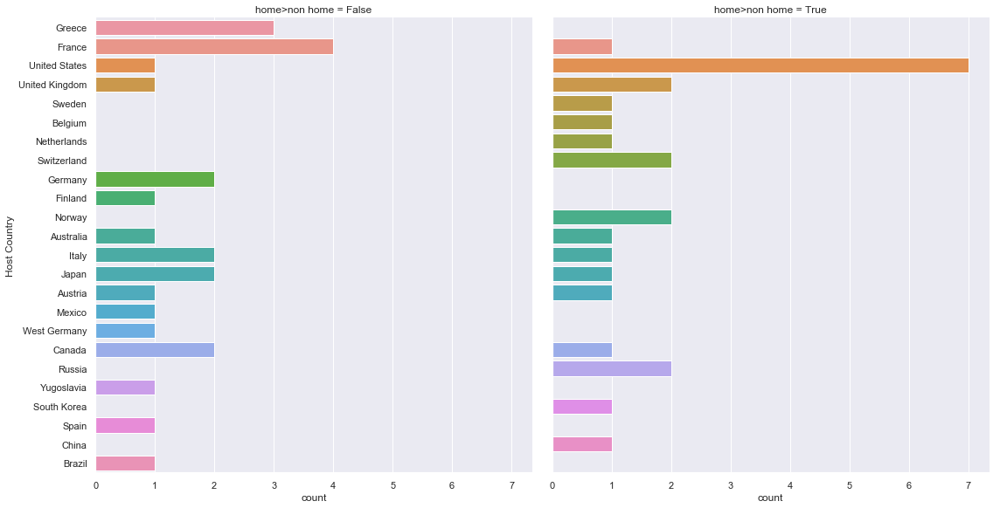

In [14]:
sb.catplot(y = 'Host Country', data = games, col = 'home>non home', kind = 'count', col_wrap = 2, height = 8)

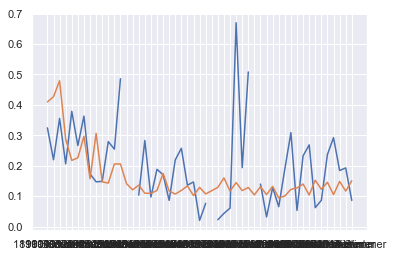

In [15]:
plt.plot(games['Games'], games['Home Win Rate'], )
plt.plot(games['Games'], games['Non Home Win Rate'])
#plt.plot(games['Games'], games['% of home medals'])

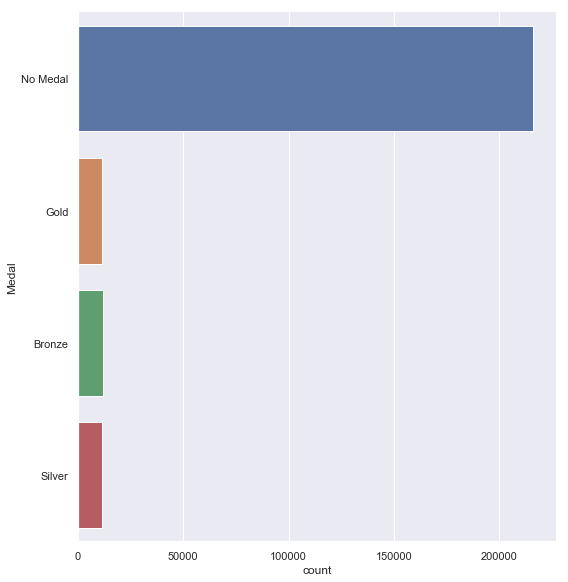

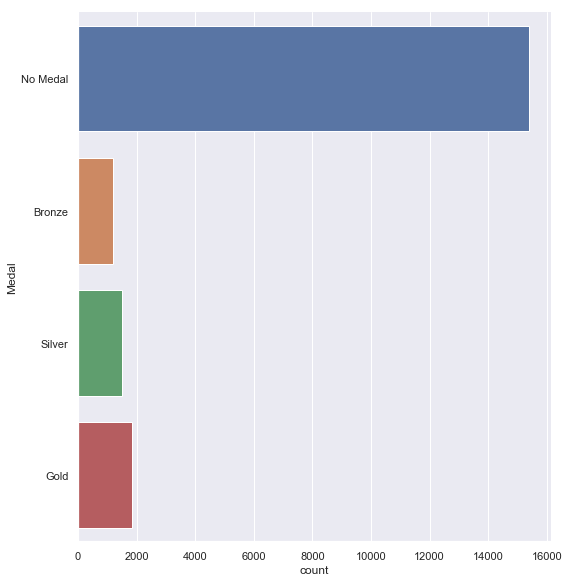

In [16]:
home_adv_data = data[data["Home Advantage"] == True]
no_home_adv_data = data[data["Home Advantage"] == False]

sb.catplot(y = "Medal", data = no_home_adv_data, kind = "count", height = 8)
sb.catplot(y = "Medal", data = home_adv_data, kind = "count", height = 8)

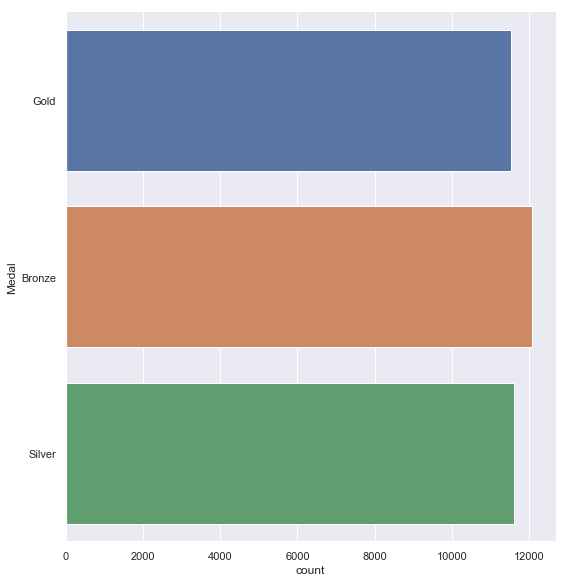

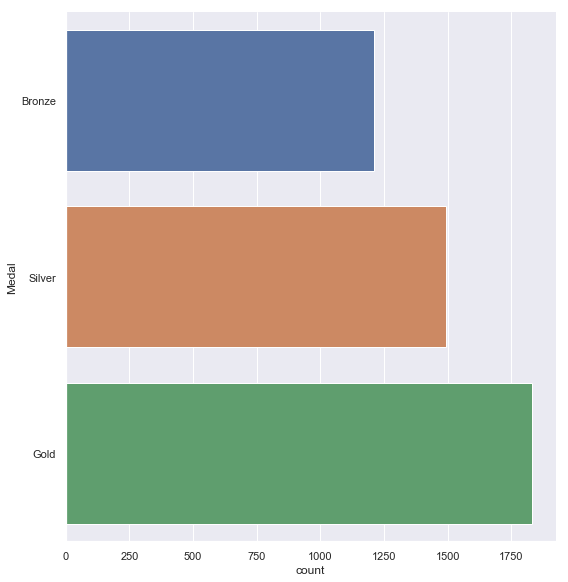

In [17]:
sb.catplot(y = "Medal", data = no_home_adv_data[no_home_adv_data["Medal"] != "No Medal"], kind = "count", height = 8)
sb.catplot(y = "Medal", data = home_adv_data[home_adv_data["Medal"] != "No Medal"], kind = "count", height = 8)

### Explore win rate and home team advantage with Plotly visualisation

In [18]:
#count total number of non-home-team
x = pd.DataFrame(no_home_adv_data["Medal"]).count(axis = 0)
NoHomeTeamTotal = x[0]

#drops all non-medalist
no_home_adv_medalist = no_home_adv_data[no_home_adv_data.Medal != "No Medal"]
#count number of medalist
x = pd.DataFrame(no_home_adv_medalist["Medal"]).count(axis = 0)
NoHomeTeamMedalist = x[0]
NoHomeTeamWR = NoHomeTeamMedalist / NoHomeTeamTotal
print("WR without home team = ", NoHomeTeamWR)

#count total number of home-team
y = pd.DataFrame(home_adv_data["Medal"]).count(axis = 0)
HomeTeamTotal = y[0]

#drops all non-medalist
home_adv_medalist = home_adv_data[home_adv_data.Medal != "No Medal"]
#count number of medalist
y = pd.DataFrame(home_adv_medalist["Medal"]).count(axis = 0)
HomeTeamMedalist = y[0]
HomeTeamWR = HomeTeamMedalist / HomeTeamTotal
print("WR with home team = ", HomeTeamWR)

WR without home team =  0.14029737853062363
WR with home team =  0.22795040409617992


In [19]:
import plotly.offline as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly import tools

# Activate inline plotting in notebook
py.init_notebook_mode(connected = False)

In [20]:
years = []
for i in data['Year'].unique():
    years.append(i)
years.sort()

In [21]:
data_by_year_DFarr = []

for year in years:
    data_by_year = data[data['Year'] == year]

    # Array containing unique countries
    countries = []
    for country in data_by_year['Team Country']:
        if country not in countries:
            countries.append(country)

    year_DF = pd.DataFrame()        

    for i in range(len(countries)):
        no_of_medals = data_by_year['Medal'][(data_by_year['Team Country'] == countries[i]) & (data_by_year['Medal'] != 'No Medal')].count()
        if no_of_medals != 0:
            # Add country
            year_DF.at[i, 'Country'] = countries[i]
            # Add total number of participants
            no_of_participants = data_by_year['Team Country'][data_by_year['Team Country'] == countries[i]].count()
            year_DF.at[i, 'Participants'] = no_of_participants
            # Add total numbers of medals
            year_DF.at[i, 'Medals'] = no_of_medals
            # Add win rate
            win_rate = no_of_medals/no_of_participants
            year_DF.at[i, 'Win Rate'] = win_rate
            # Add for Home Advantage
            if (countries[i] == data_by_year['Host Country'].iloc[0]):
                year_DF.at[i, 'Home Advantage'] = 'Home Team'
            else:
                year_DF.at[i, 'Home Advantage'] = 'Not Home Team'
            
    data_by_year_DFarr.append(year_DF)
    
data_by_year_DFarr[0]  # in 1896

,Country,Participants,Medals,Win Rate,Home Advantage
0,Greece,148.0,48.0,0.324324,Home Team
1,United Kingdom,25.0,9.0,0.360000,Not Home Team
2,Switzerland,8.0,3.0,0.375000,Not Home Team
3,United States,27.0,20.0,0.740741,Not Home Team
4,Germany,94.0,32.0,0.340426,Not Home Team
5,France,26.0,11.0,0.423077,Not Home Team
6,Hungary,18.0,6.0,0.333333,Not Home Team
7,Australia,5.0,3.0,0.600000,Not Home Team
8,Austria,8.0,5.0,0.625000,Not Home Team
9,Denmark,15.0,6.0,0.400000,Not Home Team


In [22]:
for i in range(len(years)):
    years[i] = str(years[i])

# make figure
figure = {
    'data': [],
    'layout': {},
    'frames': []
}

# fill in most of layout
figure['layout']['xaxis'] = {'range': [-20, 500], 'title': 'Number of medals'}
figure['layout']['yaxis'] = {'range': [-0.1, 1.1], 'title': 'Win Rate'}
figure['layout']['hovermode'] = 'closest'
figure['layout']['sliders'] = {
    'args': [
        'transition', {
            'duration': 400,
            'easing': 'cubic-in-out'
        }
    ],
    'initialValue': '1896',
    'plotlycommand': 'animate',
    'values': years,
    'visible': True
}
figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Year:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}

# make data
year = 1896
check_HT = ['Home Team', 'Not Home Team']
for check in check_HT:
    data_vs_year = data_by_year_DFarr[0]
    data_vs_year_and_checkHT = data_vs_year[data_vs_year['Home Advantage'] == check]

    data_dict = {
        'x': list(data_vs_year_and_checkHT['Medals']),
        'y': list(data_vs_year_and_checkHT['Win Rate']),
        'mode': 'markers',
        'text': list(data_vs_year_and_checkHT['Country']),
        'marker': {
            'sizemode': 'area',
            'sizeref': 0.5,
            'size': list(data_vs_year_and_checkHT['Participants'])
        },
        'name': check
    }
    figure['data'].append(data_dict)
    
# make frames
for i in range(len(years)):
    frame = {'data': [], 'name': str(years[i])}
    for check in check_HT:
        data_vs_year = data_by_year_DFarr[i]
        data_vs_year_and_checkHT = data_vs_year[data_vs_year['Home Advantage'] == check]

        data_dict = {
            'x': list(data_vs_year_and_checkHT['Medals']),
            'y': list(data_vs_year_and_checkHT['Win Rate']),
            'mode': 'markers',
            'text': list(data_vs_year_and_checkHT['Country']),
            'marker': {
                'sizemode': 'area',
                'sizeref': 0.5,
                'size': list(data_vs_year_and_checkHT['Participants'])
            },
            'name': check
        }
        frame['data'].append(data_dict)

    figure['frames'].append(frame)
    slider_step = {'args': [
        [years[i]],
        {'frame': {'duration': 300, 'redraw': False},
         'mode': 'immediate',
       'transition': {'duration': 300}}
     ],
     'label': years[i],
     'method': 'animate'}
    sliders_dict['steps'].append(slider_step)

    
figure['layout']['sliders'] = [sliders_dict]

py.iplot(figure)

### Fill missing values for Age, Height and Weight

In [23]:
mean_age = int(data['Age'].mean(skipna = True))
data['Age'].fillna(value = mean_age, inplace = True)

overal_male_mean_height = data[(data['Sex'] == 'M')]['Height'].mean(skipna = True)
overal_male_mean_weight = data[(data['Sex'] == 'M')]['Weight'].mean(skipna = True)
overal_female_mean_height = data[(data['Sex'] == 'F')]['Height'].mean(skipna = True)
overal_female_mean_weight = data[(data['Sex'] == 'F')]['Weight'].mean(skipna = True)

for sport in data['Sport'].unique():
    male = data[(data['Sport'] == sport) & (data['Sex'] == 'M')]
    male_mean_height = male['Height'].mean(skipna = True)
    male_mean_weight = male['Weight'].mean(skipna = True)
    if np.isnan(male_mean_height):
        data.loc[(data['Sport'] == sport) & (data['Sex'] == 'M') & (data['Height'].isnull() == True), 'Height'] = overal_male_mean_height
    else:
        data.loc[(data['Sport'] == sport) & (data['Sex'] == 'M') & (data['Height'].isnull() == True), 'Height'] = male_mean_height
    if np.isnan(male_mean_weight):
        data.loc[(data['Sport'] == sport) & (data['Sex'] == 'M') & (data['Weight'].isnull() == True), 'Weight'] = overal_male_mean_weight
    else:
        data.loc[(data['Sport'] == sport) & (data['Sex'] == 'M') & (data['Weight'].isnull() == True), 'Weight'] = male_mean_weight
    
    female = data[(data['Sport'] == sport) & (data['Sex'] == 'F')]
    female_mean_height = female['Height'].mean(skipna = True)
    female_mean_weight = female['Weight'].mean(skipna = True)
    if np.isnan(female_mean_height):
        data.loc[(data['Sport'] == sport) & (data['Sex'] == 'F') & (data['Height'].isnull() == True), 'Height'] = overal_female_mean_height
    else:
        data.loc[(data['Sport'] == sport) & (data['Sex'] == 'F') & (data['Height'].isnull() == True), 'Height'] = female_mean_height
    if np.isnan(female_mean_weight):
        data.loc[(data['Sport'] == sport) & (data['Sex'] == 'F') & (data['Weight'].isnull() == True), 'Weight'] = overal_female_mean_weight
    else:
        data.loc[(data['Sport'] == sport) & (data['Sex'] == 'F') & (data['Weight'].isnull() == True), 'Weight'] = female_mean_weight

In [24]:
data.head(5)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Host Country,Team Country,Home Advantage
0,1,A Dijiang,M,24.0,180.000000,80.000000,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,No Medal,Spain,China,False
1,2,A Lamusi,M,23.0,170.000000,60.000000,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,No Medal,United Kingdom,China,False
2,3,Gunnar Nielsen Aaby,M,24.0,177.480339,73.086644,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,No Medal,Belgium,Denmark,False
3,4,Edgar Lindenau Aabye,M,34.0,182.480000,95.615385,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,France,Denmark,False
4,5,Christine Jacoba Aaftink,F,21.0,185.000000,82.000000,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,No Medal,Canada,Netherlands,False


In [25]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 18 columns):
ID                271116 non-null int64
Name              271116 non-null object
Sex               271116 non-null object
Age               271116 non-null float64
Height            271116 non-null float64
Weight            271116 non-null float64
Team              271116 non-null object
NOC               271116 non-null object
Games             271116 non-null object
Year              271116 non-null int64
Season            271116 non-null object
City              271116 non-null object
Sport             271116 non-null object
Event             271116 non-null object
Medal             271116 non-null object
Host Country      271116 non-null object
Team Country      271116 non-null object
Home Advantage    271116 non-null object
dtypes: float64(3), int64(2), object(13)
memory usage: 37.2+ MB


### Neural network with PyTorch

@ Need to install PyTorch: https://medium.com/@bryant.kou/how-to-install-pytorch-on-windows-step-by-step-cc4d004adb2a 

In [26]:
# Import Libraries
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torch.autograd import Variable
import pandas as pd
from sklearn.model_selection import train_test_split

In [27]:
# Label for medals
for i in data.index:
    if (data.at[i, 'Medal'] == 'Gold'):
        data.at[i, 'Medal Label'] = 1
    elif (data.at[i, 'Medal'] == 'Silver'):
        data.at[i, 'Medal Label'] = 2
    elif (data.at[i, 'Medal'] == 'Bronze'):
        data.at[i, 'Medal Label'] = 3
    elif (data.at[i, 'Medal'] == 'No Medal'):
        data.at[i, 'Medal Label'] = 0

In [28]:
data['Age'] = data['Age'].astype('float32')
data['Height'] = data['Height'].astype('float32')
data['Weight'] = data['Weight'].astype('float32')
data['Medal Label'] = data['Medal Label'].astype('int64')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 19 columns):
ID                271116 non-null int64
Name              271116 non-null object
Sex               271116 non-null object
Age               271116 non-null float32
Height            271116 non-null float32
Weight            271116 non-null float32
Team              271116 non-null object
NOC               271116 non-null object
Games             271116 non-null object
Year              271116 non-null int64
Season            271116 non-null object
City              271116 non-null object
Sport             271116 non-null object
Event             271116 non-null object
Medal             271116 non-null object
Host Country      271116 non-null object
Team Country      271116 non-null object
Home Advantage    271116 non-null object
Medal Label       271116 non-null int64
dtypes: float32(3), int64(3), object(13)
memory usage: 36.2+ MB


In [29]:
data.sample(5)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Host Country,Team Country,Home Advantage,Medal Label
163687,82167,Dorothy Sarkis Morkis,F,33.0,172.000000,59.000000,United States,USA,1976 Summer,1976,Summer,Montreal,Equestrianism,"Equestrianism Mixed Dressage, Team",Bronze,Canada,United States,False,3
93215,47198,Betty Heidler,F,24.0,175.000000,85.000000,Germany,GER,2008 Summer,2008,Summer,Beijing,Athletics,Athletics Women's Hammer Throw,No Medal,China,Germany,False,0
169571,85255,Ferenc Nmeth,M,24.0,181.000000,71.000000,Hungary,HUN,1960 Summer,1960,Summer,Roma,Modern Pentathlon,Modern Pentathlon Men's Team,Gold,Italy,Hungary,False,1
248604,124453,Georges M. Van Der Ton,M,35.0,176.563171,70.924561,Belgium,BEL,1928 Summer,1928,Summer,Amsterdam,Equestrianism,"Equestrianism Men's Three-Day Event, Individual",No Medal,Netherlands,Belgium,False,0
175318,88106,Theresa Mary Offredy (Offredi-),F,34.0,165.000000,60.000000,Great Britain,GBR,1964 Summer,1964,Summer,Tokyo,Fencing,"Fencing Women's Foil, Team",No Medal,Japan,United Kingdom,False,0


In [30]:
# Prepare Dataset

# split data into features(age, height, weight) and labels(numbers from 1 to 4)
targets_numpy = data["Medal Label"].values
features_numpy = data[["Age", "Height", "Weight"]].values

# train test split. Size of train data is 80% and size of test data is 20%. 
features_train, features_test, targets_train, targets_test = train_test_split(features_numpy,
                                                                             targets_numpy,
                                                                             test_size = 0.2,
                                                                             random_state = 42)

# create feature and targets tensor for train set. 
# As you remember we need variable to accumulate gradients. 
#Therefore first we create tensor, then we will create variable
featuresTrain = torch.from_numpy(features_train)
targetsTrain = torch.from_numpy(targets_train).type(torch.LongTensor) # data type is long 

# create feature and targets tensor for test set.
featuresTest = torch.from_numpy(features_test)
targetsTest = torch.from_numpy(targets_test).type(torch.LongTensor) # data type is long

# batch_size, iteration and epoch
batch_size = 100
n_iters = 10000
num_epochs = n_iters / (len(features_train) / batch_size)
num_epochs = int(num_epochs)


# Pytorch train and test sets
train = torch.utils.data.TensorDataset(featuresTrain,targetsTrain)
test = torch.utils.data.TensorDataset(featuresTest,targetsTest)

# data loader
train_loader = torch.utils.data.DataLoader(train, batch_size = batch_size, shuffle = False)
test_loader = torch.utils.data.DataLoader(test, batch_size = batch_size, shuffle = False)

In [31]:
# Create ANN Model

# Layers sizes:

# Input Layer (Age, Height, Weight) (input_dim) = 3
# Hidden Layer (hidden_dim) = 50  :  Add 3 hidden layers
# Output Layer (Medal Label: 1 -> 4)(output_dim)= 4

class ANNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(ANNModel, self).__init__()
        # Linear function 1: 
        self.fc1 = nn.Linear(input_dim, hidden_dim) 
        # Non-linearity 1
        self.relu1 = nn.ReLU()
        
        # Linear function 2: 
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        # Non-linearity 2
        self.tanh2 = nn.Tanh()
        
        # Linear function 3: 
        self.fc3 = nn.Linear(hidden_dim, hidden_dim)
        # Non-linearity 3
        self.elu3 = nn.ELU()
        
        # Linear function 4 (readout): 
        self.fc4 = nn.Linear(hidden_dim, output_dim) 

    def forward(self, x):
        # Linear function 1
        out = self.fc1(x.float())
        # Non-linearity 1
        out = self.relu1(out)
        
        # Linear function 2
        out = self.fc2(out)
        # Non-linearity 2
        out = self.tanh2(out)
        
        # Linear function 2
        out = self.fc3(out)
        # Non-linearity 2
        out = self.elu3(out)
        
        # Linear function 4 (readout)
        out = self.fc4(out)
        return out


# instantiate ANN
input_dim = 3
hidden_dim = 50 # Can change 
output_dim = 4

# Create ANN
model = ANNModel(input_dim, hidden_dim, output_dim)

# Cross Entropy Loss 
error = nn.CrossEntropyLoss()

# SGD Optimizer
learning_rate = 0.02
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

In [32]:
# ANN model training
count = 0
loss_list = []
iteration_list = []
accuracy_list = []
for epoch in range(num_epochs):
    for i, (info, labels) in enumerate(train_loader):

        train = Variable(info.view(-1, input_dim))
        labels = Variable(labels)

        # Clear gradients
        optimizer.zero_grad()
        
        # Forward propagation
        outputs = model(train)

        # Calculate softmax and ross entropy loss
        loss = error(outputs, labels)
        
        # Calculating gradients
        loss.backward()

        # Update parameters
        optimizer.step()
        
        count += 1
        
        if count % 50 == 0:
            # Calculate Accuracy
            correct = 0
            total = 0
            # Predict test dataset
            for images, labels in test_loader:

                test = Variable(images.view(-1, input_dim))
                
                # Forward propagation
                outputs = model(test)
                
                # Get predictions from the maximum value
                predicted = torch.max(outputs.data, 1)[1]
                
                # Total number of labels
                total += len(labels)

                # Total correct predictions
                correct += (predicted == labels).sum()

            accuracy = 100 * correct / float(total)
            
            # store loss and iteration
            loss_list.append(loss.data)
            iteration_list.append(count)
            accuracy_list.append(accuracy)
            if count % 500 == 0:
                # Print Loss
                print('Iteration: {}  Loss: {}  Accuracy: {} %'.format(count, loss.data, accuracy))

Iteration: 500  Loss: 0.7551308274269104  Accuracy: 85 %
Iteration: 1000  Loss: 0.6758063435554504  Accuracy: 85 %
Iteration: 1500  Loss: 0.6728197336196899  Accuracy: 85 %
Iteration: 2000  Loss: 0.5028274655342102  Accuracy: 85 %
Iteration: 2500  Loss: 0.6485397219657898  Accuracy: 85 %
Iteration: 3000  Loss: 0.5611385107040405  Accuracy: 85 %
Iteration: 3500  Loss: 0.6198354363441467  Accuracy: 85 %
Iteration: 4000  Loss: 0.5032919645309448  Accuracy: 85 %
Iteration: 4500  Loss: 0.5585628747940063  Accuracy: 85 %
Iteration: 5000  Loss: 0.6440045833587646  Accuracy: 85 %
Iteration: 5500  Loss: 0.620065450668335  Accuracy: 85 %
Iteration: 6000  Loss: 0.47396212816238403  Accuracy: 85 %
Iteration: 6500  Loss: 0.5010411143302917  Accuracy: 85 %
Iteration: 7000  Loss: 0.5335275530815125  Accuracy: 85 %
Iteration: 7500  Loss: 0.5574591755867004  Accuracy: 85 %
Iteration: 8000  Loss: 0.6170503497123718  Accuracy: 85 %
Iteration: 8500  Loss: 0.5597686171531677  Accuracy: 85 %


In [33]:
from matplotlib import pyplot

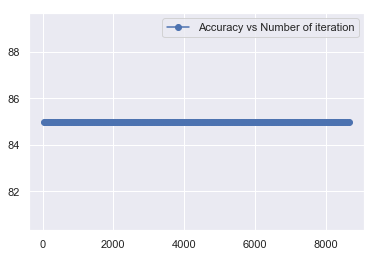

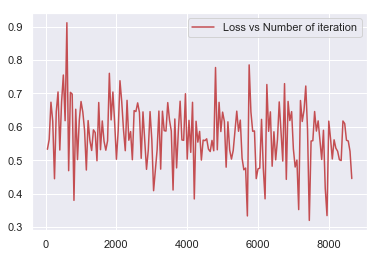

In [34]:
# visualization accuracy 
pyplot.figure()
pyplot.plot(iteration_list, accuracy_list, marker="o", label='Accuracy vs Number of iteration')
pyplot.legend()
pyplot.show()

# visualization loss 
pyplot.figure()
pyplot.plot(iteration_list, loss_list, "r", label='Loss vs Number of iteration')
pyplot.legend()
pyplot.show()

# classificaion tree with all medals as prediction

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.8547829465370297

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.8539665678159902



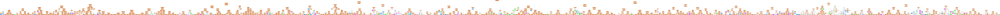

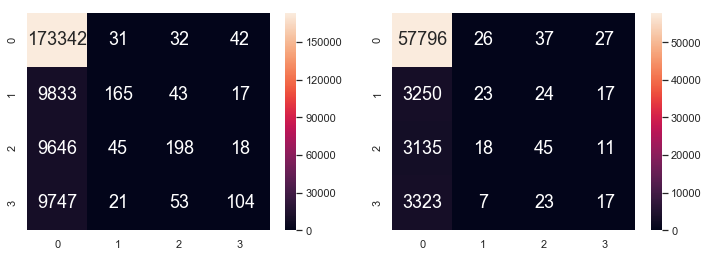

In [35]:
# Import essential models and functions from sklearn
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import export_graphviz
import graphviz

# Extract Response and Predictors
y = pd.DataFrame(data['Medal Label'])
X = pd.DataFrame(data[["Age", "Height", "Weight", "Home Advantage"]]) 

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 10)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# classificaion tree with only gold and no medal

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9462207401595397

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9459764290501332



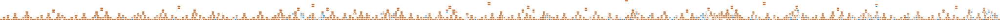

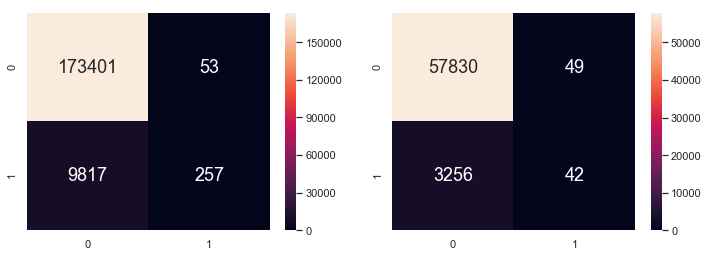

In [36]:
# Import essential models and functions from sklearn
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import export_graphviz
import graphviz

#gold and no medal data
gold_data = data[data['Medal Label'] != 3]
gold_data = gold_data[gold_data['Medal Label'] != 2]
gold_data['Medal Label'].unique()

# Extract Response and Predictors
y = pd.DataFrame(gold_data['Medal Label'])
X = pd.DataFrame(gold_data[["Age", "Height", "Weight", "Home Advantage"]]) 

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 10)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# classificaion tree with only silver and no medal

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9472389492516472

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9463452947817976



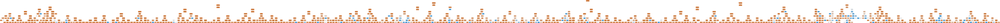

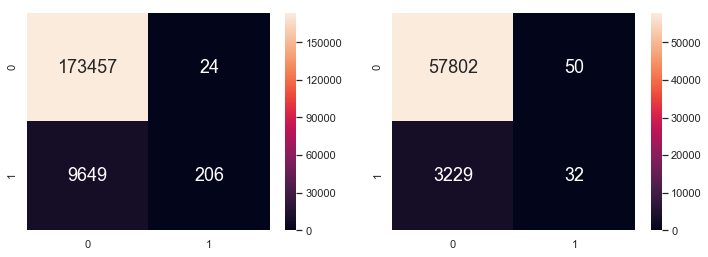

In [37]:
# Import essential models and functions from sklearn
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import export_graphviz
import graphviz

#gold and no medal data
silver_data = data[data['Medal Label'] != 3]
silver_data = silver_data[silver_data['Medal Label'] != 1]
silver_data['Medal Label'].unique()

# Extract Response and Predictors
y = pd.DataFrame(silver_data['Medal Label'])
X = pd.DataFrame(silver_data[["Age", "Height", "Weight", "Home Advantage"]]) 

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 10)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# classificaion tree with only bronze and no medal

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9475825806170092

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9456089539050612



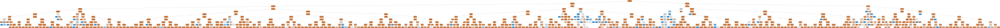

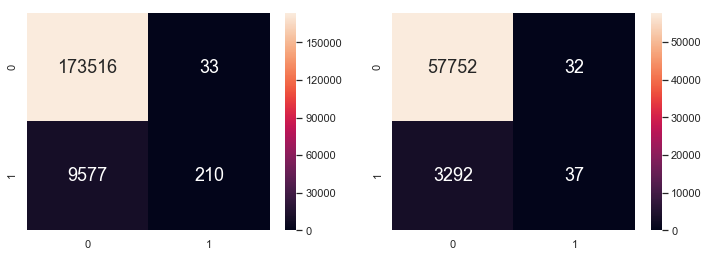

In [38]:
# Import essential models and functions from sklearn
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import export_graphviz
import graphviz

#gold and no medal data
bronze_data = data[data['Medal Label'] != 2]
bronze_data = bronze_data[bronze_data['Medal Label'] != 1]
bronze_data['Medal Label'].unique()

# Extract Response and Predictors
y = pd.DataFrame(silver_data['Medal Label'])
X = pd.DataFrame(silver_data[["Age", "Height", "Weight", "Home Advantage"]]) 

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 10)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

### Predicting No Medal and Gold medal on Male Shot Put athletes

In [39]:
athletics = data[data['Sport'] == 'Athletics']
male_athletics = athletics[athletics['Sex'] == 'M']
shot_put = male_athletics[male_athletics['Event'] == "Athletics Men's Shot Put"]
shot_put

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Host Country,Team Country,Home Advantage,Medal Label
57,18,Timo Antero Aaltonen,M,31.0,189.000000,130.000000,Finland,FIN,2000 Summer,2000,Summer,Sydney,Athletics,Athletics Men's Shot Put,No Medal,Australia,Finland,False,0
984,554,Benik Abramyan,M,31.0,186.000000,115.000000,Georgia,GEO,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,Athletics Men's Shot Put,No Medal,Brazil,Georgia,False,0
1216,684,Ahmed Mohamed Achouche,M,28.0,191.000000,110.000000,Egypt,EGY,1984 Summer,1984,Summer,Los Angeles,Athletics,Athletics Men's Shot Put,No Medal,United States,Egypt,False,0
1217,684,Ahmed Mohamed Achouche,M,32.0,191.000000,110.000000,Egypt,EGY,1988 Summer,1988,Summer,Seoul,Athletics,Athletics Men's Shot Put,No Medal,South Korea,Egypt,False,0
2308,1284,Jess Aguirre Delgado,M,25.0,175.000000,73.839127,Mexico,MEX,1924 Summer,1924,Summer,Paris,Athletics,Athletics Men's Shot Put,No Medal,France,Mexico,False,0
2309,1284,Jess Aguirre Delgado,M,25.0,175.000000,73.839127,Mexico,MEX,1928 Summer,1928,Summer,Amsterdam,Athletics,Athletics Men's Shot Put,No Medal,Netherlands,Mexico,False,0
2417,1355,"Henrik Aleksander ""Heikki"" hlman (-Pennola)",M,26.0,179.768295,73.839127,Finland,FIN,1906 Summer,1906,Summer,Athina,Athletics,Athletics Men's Shot Put,No Medal,Greece,Finland,False,0
2536,1428,Paavo Aho,M,20.0,180.000000,63.000000,Finland,FIN,1912 Summer,1912,Summer,Stockholm,Athletics,Athletics Men's Shot Put,No Medal,Sweden,Finland,False,0
3038,1695,Lahcen Samsam Akka,M,22.0,195.000000,120.000000,Morocco,MAR,1964 Summer,1964,Summer,Tokyo,Athletics,Athletics Men's Shot Put,No Medal,Japan,Morocco,False,0
3039,1695,Lahcen Samsam Akka,M,30.0,195.000000,120.000000,Morocco,MAR,1972 Summer,1972,Summer,Munich,Athletics,Athletics Men's Shot Put,No Medal,West Germany,Morocco,False,0


Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9594882729211087

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9299363057324841



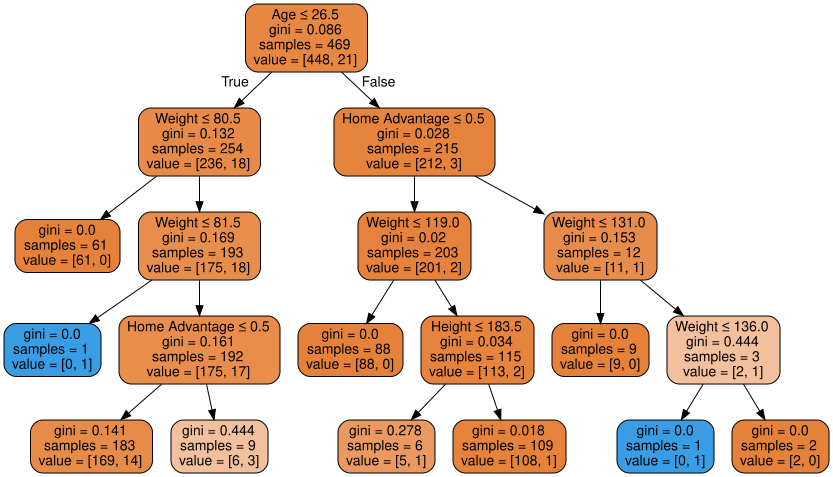

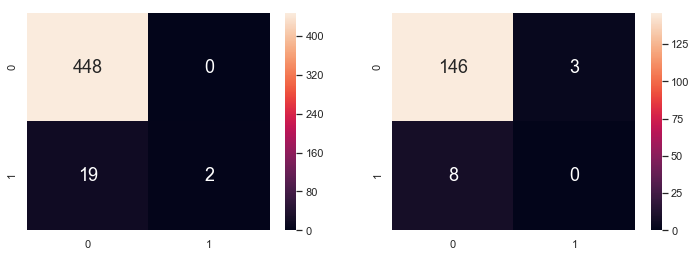

In [40]:
# Import essential models and functions from sklearn
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import export_graphviz
import graphviz

#gold and no medal data
gold_data = shot_put[shot_put['Medal Label'] != 3]
gold_data = gold_data[gold_data['Medal Label'] != 2]
gold_data['Medal Label'].unique()

# Extract Response and Predictors
y = pd.DataFrame(gold_data['Medal Label'])
X = pd.DataFrame(gold_data[["Age", "Height", "Weight", "Home Advantage"]]) 

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 4)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

## Naive Bayes Alogrithm

In [41]:
from sklearn.naive_bayes import GaussianNB
# split data into features(age, height, weight) and labels(numbers from 1 to 4)
targets_numpy = data["Medal"].values
features_numpy = data[["Age", "Height", "Weight"]].values

# train test split. Size of train data is 80% and size of test data is 20%. 
features_train, features_test, targets_train, targets_test = train_test_split(features_numpy,
                                                                             targets_numpy,
                                                                             test_size = 0.2,
                                                                             random_state = 42)
targets_numpy = data["Medal"].values
age_numpy = data["Age"].values
height_numpy = data["Height"].values
weight_numpy = data["Weight"].values
# train test split. Size of train data is 80% and size of test data is 20%. 
age_train, age_test, targets_train, targets_test = train_test_split(age_numpy,
                                                                    targets_numpy,
                                                                    test_size = 0.2,
                                                                    random_state = 42)
height_train, height_test, weight_train, weight_test = train_test_split(height_numpy,
                                                                    weight_numpy,
                                                                    test_size = 0.2,
                                                                    random_state = 42)
#Create a Gaussian Classifier
model = GaussianNB()

# Train the model using the training sets 
model.fit(features_train, targets_train)

#Predict Output 
predicted = model.predict(features_test)
print("Predicton:", predicted)
print("\nActual result:", targets_test)
print("\nModel score: ", model.score(features_test,targets_test))

Predicton: ['No Medal' 'No Medal' 'No Medal' ... 'No Medal' 'No Medal' 'No Medal']

Actual result: ['No Medal' 'Silver' 'No Medal' ... 'No Medal' 'No Medal' 'No Medal']

Model score:  0.852777367955149


In [42]:
print("Age = 22 , Height = 187 , Weight = 156")
print("The predicted medal is ", model.predict([[22, 187, 156]]))
print("The predicted probabilities are ", model.predict_proba([[22, 187, 156]]))

Age = 22 , Height = 187 , Weight = 156
The predicted medal is  ['Gold']
The predicted probabilities are  [[0.29948057 0.38362436 0.12133029 0.19556479]]


In [43]:
print("Provide a person with his/her age, height and weight")
print("Then let's see whether he/she has chance to win medals or not")
age = int(input("Enter age: "))
height = int(input("Enter height: "))
weight = int(input("Enter weight: "))
print("The predicted medal is ", model.predict([[age, height, weight]]))
print("The predicted probabilities are ", model.predict_proba([[age, height, weight]]))

Provide a person with his/her age, height and weight
Then let's see whether he/she has chance to win medals or not
Enter age: 22
Enter height: 187
Enter weight: 156
The predicted medal is  ['Gold']
The predicted probabilities are  [[0.29948057 0.38362436 0.12133029 0.19556479]]


In [ ]:
count = 0
a = 0
b = 0
c = 0
d = 0
for i in predicted:
    count+=1
    if i == 0:
        a +=1
    elif i == 1:
        print(features_test[count-1])
        b+=1
    elif i == 2:
        c+=1
    elif i == 3:
        d+=1
        
        
print(a)
print(b)
print(c)
print(d)

In [ ]:
from sklearn.naive_bayes import GaussianNB
# split data into features(age, height, weight) and labels(numbers from 1 to 4)
dataGym = data[data['Sport'] == 'Basketball']
targets_numpy = dataGym["Medal"].values
features_numpy = dataGym[["Age", "Height", "Weight"]].values

# train test split. Size of train data is 80% and size of test data is 20%. 
features_train, features_test, targets_train, targets_test = train_test_split(features_numpy,
                                                                             targets_numpy,
                                                                             test_size = 0.2,
                                                                             random_state = 42)
targets_numpy = dataGym["Medal"].values
age_numpy = dataGym["Age"].values
height_numpy = dataGym["Height"].values
weight_numpy = dataGym["Weight"].values
# train test split. Size of train data is 80% and size of test data is 20%. 
age_train, age_test, targets_train, targets_test = train_test_split(age_numpy,
                                                                    targets_numpy,
                                                                    test_size = 0.2,
                                                                    random_state = 42)
height_train, height_test, weight_train, weight_test = train_test_split(height_numpy,
                                                                    weight_numpy,
                                                                    test_size = 0.2,
                                                                    random_state = 42)
#Create a Gaussian Classifier
model = GaussianNB()

# Train the model using the training sets 
model.fit(features_train, targets_train)

#Predict Output 
predicted = model.predict(features_test)
print("\nModel score for Basketball: ",model.score(features_test,targets_test))
print("\nprobability of each result:", model.predict_proba(features_test))


In [ ]:
count = 0
a = 0
b = 0
c = 0
d = 0
for i in predicted:
    count+=1
    if i == 'No Medal':
        a +=1
    elif i == 'Gold':
        print(features_test[count-1])
        b+=1
    elif i == 'Silver':
        c+=1
    elif i == 'Bronze':
        d+=1

        
        
print(a)
print(b)
print(c)
print(d)
